In [1]:
import torch
# torch.autograd.set_detect_anomaly(True)
from torch.utils.data import DataLoader,WeightedRandomSampler
from torch.optim.lr_scheduler import PolynomialLR
import torch.nn.functional as F
from torchvision.transforms import v2

import albumentations as A
from albumentations.pytorch import ToTensorV2
import segmentation_models_pytorch as smp

from tqdm.notebook import tqdm
import json
import cv2
import matplotlib.pyplot as plt
import numpy as np
import random
import os
###IE###
%load_ext autoreload
%autoreload 2
from utils.helpers import (
    plot_some_images ,read_images ,
    pre_hard_skeletonize , pre_soft_skeletonize,
    compute_confution_matrix,draw_mask,TP_TN_FP_FN,)
from utils.preprocessing import (
    WhiteTopHat , CLAHE , normalize_xca,
    BrightnessMultiplicativeNNUNet2D,
    ContrastAugmentationNNUNet2D)
from utils.dataset import  (
    TrainUnetDataset  
)
from models.nnunet import nnUnet
from models.memory_unet import MemoryUnet
from utils.losses import UnetLoss
from utils.recorder import HistoryRecorder
from logger import save_full_report
from trainer import trainer
###SS###
from trainer import evaluation

In [ ]:
args = {
    "base_path" : "./dataset/syntax/",
    "memory_unet":{
        "layer_count":4,
        "channel_max":256,
        "downsampling":"maxpool",
        "dropout" : False,
        "normaliztion":"BatchNorm2d",#InstanceNorm2d
        "activation" : "LeakyReLU",
        "first_layer_out_c" : 64
    },
    "image_shape" : (448,448),
    "in_c":1,
    
    "training_mode":"binary",
    "report_class_wise":True,
    "attention" : False,
    "batch_size" : 8,
    "num_workers" : 5,
    "device" : "cuda" if torch.cuda.is_available() else "cpu",
    "epcohs":10,
    "f_int_scale" : 2,
    "full_report_cycle" : 1,
    "max_channels":512,
    "loss_type":"tversky",
    "output_base_path" : "./outputs",
    "name" : "binary-tests-dropout",
    "deep_super_vision" : False,
    "mask_ce_weights":None,
    "layer_count":5,
    ### Loss Functions
    "mask_ce_conf":{
        "imp_coef":1.0
    },
    "focal_ce_conf":{
        "gamma":2.0,
        "loss_scale":1.0,
        "imp_coef":1.0
    },
    "tversky_conf":{
        "alpha":0.9,
        "beta":0.1,
        "gamma":2.00,
        "weights":None,
        "imp_coef":1.0
    },
    "cl_dice_conf":{
        "imp_coef":1.0,
        "k":40
    },
    ### Optimizers
    "sgd_conf":{
        "lr" : 0.1,
        "momentum" : 0.99,
        "weight_decay" : 3e-5,
        "nesterov":True
    },
    "adam_conf":{
        "lr" : 0.01,
        "weight_decay" : 3e-5,
    }
}
if(args["training_mode"] == "binary"):
    args["class_count"] = 2 
    class_map = {
        1:"fg"
    }

else:
    args["class_count"] = 26
    class_map = {
        1: '1',2: '2', 3: '3',4: '4',
        5: '5',6: '6',7:'9',8:'7',9:'9a',
        10:'10',11:'8',12:'10a',13:'12',14:'11',
        15:'12a',16:'12b',17:'13',18:'14',19:'14a',
        20:'14b',21:'15',22:'16',
        23: '16a',24: '16b',25: '16c',
    }

# losses_keys = ["total loss","FCE loss",args["loss_type"]]
losses_keys = ["total loss","mask CE-Loss",args["loss_type"],"cl dice loss"]
out_counts = args["layer_count"] if args["deep_super_vision"] else 1
loss_weights = [1/(2**i) for i in range(out_counts)]
loss_weights



[1.0]

In [3]:
if(args["training_mode"]!="binary"):
    b=0.999

    train_class_counts = [
        1200,374,375,369,303,525,537,
        198,340,70,21,310,1,61,320,129,
        63,305,107,49,127,38,232,43,48,31
    ]

    total = np.sum(train_class_counts)
    mask_ce_weights = np.log(total/np.array(train_class_counts))
    mask_ce_weights = (mask_ce_weights / mask_ce_weights.mean()).tolist()
    mask_ce_weights[0]=0.1

    args["mask_ce_weights"]=mask_ce_weights
    args["mask_ce_weights"]
else:
    args["mask_ce_weights"]=[0.1,1]

In [4]:
# args["t_alpha"] = [1,0.8]
args["tversky_conf"]["t_alpha"] = None

In [5]:
train_transforms = A.Compose([
    A.Resize(*args["image_shape"]),
    A.Downscale(
        scale_range=[0.7, 1],
        interpolation_pair={"downscale": 0, "upscale": 0},
        p=0.5
    ),
    A.GaussNoise(
        std_range=[0.0, 0.1],
        mean_range=[0, 0],
        per_channel=True,
        noise_scale_factor=1,
        p=0.5
    ),
    A.GaussianBlur(
        sigma_limit=[1.0,1.5],
        blur_limit = (3,7),
        p=0.5
    ),

    A.OneOf([
        A.ElasticTransform(
            alpha=120, 
            sigma=120 * 0.05, 
            p=1.0
        ),
        A.GridDistortion(num_steps=5, distort_limit=0.3, p=1.0),
        A.OpticalDistortion(distort_limit=0.2, p=1.0),
    ], p=0.5),
    A.Compose([
        A.InvertImg(p=1.0),
        A.RandomGamma(gamma_limit=(70, 150), p=1.0),
        A.InvertImg(p=1.0),
    ], p=0.5),
    BrightnessMultiplicativeNNUNet2D(multiplier_range=(0.70, 1.3), p=0.5),
    ContrastAugmentationNNUNet2D(contrast_range=(0.65, 1.5), p=0.5),
    A.RandomGamma(
        gamma_limit=(90, 120), 
        p=0.5
    ),
    A.Affine(
        scale=(0.7, 1.4),  
        translate_percent=(0, 0),
        rotate=0,               
        shear=0,                 
        fit_output=False, 
        p=0.5
    ),
    A.Rotate(limit=30, p=0.5, fill_mask = 0),
    A.Rotate(limit=-30, p=0.5, fill_mask = 0),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),

    ]
)
test_transforms = A.Compose([
    A.Resize(*args["image_shape"]),
    ]  
)

if(args["in_c"]==1):
    normalizer = normalize_xca
else:
    normalizer = A.Normalize(
        mean=(0.485, 0.456, 0.406),
        std=(0.229, 0.224, 0.225),
        max_pixel_value=255.0,
    )
train_preprocess = None


/home/parsa/Masters/Coronary Artry/Datasets/Arcade/codes/utils/preprocessing.py:51: UserWarning: Argument(s) 'always_apply' are not valid for transform BasicTransform
  super().__init__(always_apply=always_apply, p=p)
/home/parsa/Masters/Coronary Artry/Datasets/Arcade/codes/utils/preprocessing.py:64: UserWarning: Argument(s) 'always_apply' are not valid for transform BasicTransform
  super().__init__(always_apply=always_apply, p=p)


In [6]:
train_images = read_images(base_path = args["base_path"],preprocessor = train_preprocess,part = "train",chosen_labels=[19,25])
valid_images = read_images(base_path = args["base_path"],preprocessor = train_preprocess,part = "val",chosen_labels=[19,25])


NOTE : preprocessor is not defined . no preprocessing will be used !


  0%|          | 0/1000 [00:00<?, ?it/s]

NOTE : preprocessor is not defined . no preprocessing will be used !


  0%|          | 0/200 [00:00<?, ?it/s]

In [7]:

train_ds = TrainUnetDataset(
    transform = train_transforms,
    data = train_images , 
    normalizer = normalizer,
    example_phase=False
)
valid_ds = TrainUnetDataset(
    transform = test_transforms,
    data = valid_images,
    normalizer = normalizer,
    example_phase=False
)
# sampler = WeightedRandomSampler(
#     weights=sampler_weights, 
#     num_samples=len(sampler_weights),
#     replacement=True)

train_loader = DataLoader(
    train_ds,
    batch_size = args["batch_size"] ,
    num_workers = args["num_workers"] ,
    pin_memory=True,
    shuffle=True
    # sampler=sampler
)
valid_loader = DataLoader(
    valid_ds,
    batch_size = args["batch_size"]  ,
    num_workers = args["num_workers"] ,
    pin_memory=True,
    shuffle=False
)


In [8]:

# model = nnUnet(args).to(args["device"])
model = MemoryUnet(args).to(args["device"])

loss_fn = UnetLoss(args)
# optimizer = torch.optim.Adam(
#     model.parameters(), 
#     **args["adam_conf"]
# )
optimizer = torch.optim.SGD(
    model.parameters(),
    **args["sgd_conf"]
)
# optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-2)
# lr_sch = PolynomialLR(optimizer=optimizer,total_iters=args["epcohs"],power=0.9)
lr_sch = None
recorder = HistoryRecorder(losses_keys=losses_keys,class_maps =class_map,class_count=args["class_count"]-1)


best_model = trainer(
    args=args,
    recorder = recorder,
    model = model,
    optimizer = optimizer,
    loss_fn = loss_fn,
    train_loader = train_loader,
    valid_loader = valid_loader,
    loss_weights=loss_weights,
    lr_sch = lr_sch
)
# best_model = model


encoder info : 
[1, 64, 128, 256, 256]
-----------------------
loss is set to tversky


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (0)
total loss : 1.3290552859306335 - mask CE-Loss : 0.3955504366159439 - tversky : 0.4130203095674515
cl dice loss : 0.520484540939331 - 
train avg metrics for epoch 0 :
avg dice : 0.44913727045059204 - avg precision : 0.3537045419216156 - avg recall : 0.6150957345962524
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (0)
total loss : 0.9004571461677551 - mask CE-Loss : 0.35724575340747833 - tversky : 0.19283966481685638
cl dice loss : 0.35037172079086304 - 
valid avg metrics for epoch 0 :
avg dice : 0.6398376822471619 - avg precision : 0.5929344296455383 - avg recall : 0.6947987079620361
fg => dice : 0.6398376822471619 p : 0.5929344296455383 , r : 0.6947987079620361
------------------------------------------------------------
New Best! : dice = 0.6398376822471619


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (1)
total loss : 0.9430135707855225 - mask CE-Loss : 0.3209312777519226 - tversky : 0.23800627422332762
cl dice loss : 0.3840760164260864 - 
train avg metrics for epoch 1 :
avg dice : 0.6154193878173828 - avg precision : 0.5562083721160889 - avg recall : 0.6887389421463013
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (1)
total loss : 0.8479505515098572 - mask CE-Loss : 0.3119523674249649 - tversky : 0.1865301877260208
cl dice loss : 0.34946799516677857 - 
valid avg metrics for epoch 1 :
avg dice : 0.6529033184051514 - avg precision : 0.6176022291183472 - avg recall : 0.6924845576286316
fg => dice : 0.6529033184051514 p : 0.6176022291183472 , r : 0.6924845576286316
------------------------------------------------------------
New Best! : dice = 0.6529033184051514


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (2)
total loss : 0.9011390118598938 - mask CE-Loss : 0.31075793409347535 - tversky : 0.22066314536333084
cl dice loss : 0.3697179312705994 - 
train avg metrics for epoch 2 :
avg dice : 0.6302852034568787 - avg precision : 0.5746141672134399 - avg recall : 0.6979008316993713
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (2)
total loss : 0.821886682510376 - mask CE-Loss : 0.326756489276886 - tversky : 0.17006682246923446
cl dice loss : 0.3250633692741394 - 
valid avg metrics for epoch 2 :
avg dice : 0.6677150726318359 - avg precision : 0.6271447539329529 - avg recall : 0.7138975262641907
fg => dice : 0.6677150726318359 p : 0.6271447539329529 , r : 0.7138975262641907
------------------------------------------------------------
New Best! : dice = 0.6677150726318359


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (3)
total loss : 0.8560789875984192 - mask CE-Loss : 0.29316140854358674 - tversky : 0.20853450191020967
cl dice loss : 0.3543830819129944 - 
train avg metrics for epoch 3 :
avg dice : 0.6452307105064392 - avg precision : 0.5893899202346802 - avg recall : 0.7127600312232971
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (3)
total loss : 0.813735842704773 - mask CE-Loss : 0.2988468670845032 - tversky : 0.192639399766922
cl dice loss : 0.32224957704544066 - 
valid avg metrics for epoch 3 :
avg dice : 0.6631396412849426 - avg precision : 0.5955989360809326 - avg recall : 0.747957706451416
fg => dice : 0.6631396412849426 p : 0.5955989360809326 , r : 0.747957706451416
------------------------------------------------------------


  0%|          | 0/125 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.3143, device='cuda:0')
----------------------

current lr : 0.1
train ==> epcoh (4)
total loss : 0.8303537087440491 - mask CE-Loss : 0.2833636339902878 - tversky : 0.19997756552696228
cl dice loss : 0.3470125102996826 - 
train avg metrics for epoch 4 :
avg dice : 0.6528562903404236 - avg precision : 0.5961096286773682 - avg recall : 0.7215436697006226
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (4)
total loss : 0.8109298443794251 - mask CE-Loss : 0.26610047340393067 - tversky : 0.2130095613002777
cl dice loss : 0.33181980371475217 - 
valid avg metrics for epoch 4 :
avg dice : 0.6597709655761719 - avg precision : 0.5843475461006165 - avg recall : 0.7575502395629883
fg => dice : 0.6597709655761719 p : 0.5843475461006165 , r : 0.7575502395629883
------------------------------------------------------------


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (5)
total loss : 0.8445161604881286 - mask CE-Loss : 0.289244601726532 - tversky : 0.204909686088562
cl dice loss : 0.3503618745803833 - 
train avg metrics for epoch 5 :
avg dice : 0.6489467620849609 - avg precision : 0.5937015414237976 - avg recall : 0.7155283093452454
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (5)
total loss : 0.726552038192749 - mask CE-Loss : 0.25416837573051454 - tversky : 0.15706538587808608
cl dice loss : 0.31531827449798583 - 
valid avg metrics for epoch 5 :
avg dice : 0.6950600743293762 - avg precision : 0.6548837423324585 - avg recall : 0.7404881715774536
fg => dice : 0.6950600743293762 p : 0.6548837423324585 , r : 0.7404881715774536
------------------------------------------------------------
New Best! : dice = 0.6950600743293762


  0%|          | 0/125 [00:00<?, ?it/s]

--- Total Norm ---
tensor(0.1877, device='cuda:0')
----------------------

current lr : 0.1
train ==> epcoh (6)
total loss : 0.7952411756515503 - mask CE-Loss : 0.26975675666332244 - tversky : 0.19100243324041366
cl dice loss : 0.3344819865226746 - 
train avg metrics for epoch 6 :
avg dice : 0.6638518571853638 - avg precision : 0.6101434826850891 - avg recall : 0.7279283404350281
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (6)
total loss : 0.6942158150672912 - mask CE-Loss : 0.24155125975608827 - tversky : 0.1584084728360176
cl dice loss : 0.2942560839653015 - 
valid avg metrics for epoch 6 :
avg dice : 0.703457772731781 - avg precision : 0.6430460810661316 - avg recall : 0.7763973474502563
fg => dice : 0.703457772731781 p : 0.6430460810661316 , r : 0.7763973474502563
------------------------------------------------------------
New Best! : dice = 0.703457772731781


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (7)
total loss : 0.7745586113929749 - mask CE-Loss : 0.2644207627773285 - tversky : 0.182627190887928
cl dice loss : 0.32751065683364866 - 
train avg metrics for epoch 7 :
avg dice : 0.6720272898674011 - avg precision : 0.6179513931274414 - avg recall : 0.7364750504493713
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (7)
total loss : 0.6980625998973846 - mask CE-Loss : 0.26786972463130954 - tversky : 0.1347203430533409
cl dice loss : 0.2954725360870361 - 
valid avg metrics for epoch 7 :
avg dice : 0.711177408695221 - avg precision : 0.6889944672584534 - avg recall : 0.734836220741272
fg => dice : 0.711177408695221 p : 0.6889944672584534 , r : 0.734836220741272
------------------------------------------------------------
New Best! : dice = 0.711177408695221


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (8)
total loss : 0.7441851201057434 - mask CE-Loss : 0.25050180780887604 - tversky : 0.1746359374523163
cl dice loss : 0.3190473747253418 - 
train avg metrics for epoch 8 :
avg dice : 0.6789993643760681 - avg precision : 0.6265220046043396 - avg recall : 0.741071343421936
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (8)
total loss : 0.7232899439334869 - mask CE-Loss : 0.2703578740358353 - tversky : 0.15459979176521302
cl dice loss : 0.2983322763442993 - 
valid avg metrics for epoch 8 :
avg dice : 0.6969929337501526 - avg precision : 0.6347652673721313 - avg recall : 0.7727473974227905
fg => dice : 0.6969929337501526 p : 0.6347652673721313 , r : 0.7727473974227905
------------------------------------------------------------


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (9)
total loss : 0.7345331792831421 - mask CE-Loss : 0.24950911438465118 - tversky : 0.1730204735994339
cl dice loss : 0.3120035929679871 - 
train avg metrics for epoch 9 :
avg dice : 0.6840931177139282 - avg precision : 0.6295977234840393 - avg recall : 0.7489162087440491
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (9)
total loss : 0.6594644951820373 - mask CE-Loss : 0.2598287606239319 - tversky : 0.11388660252094268
cl dice loss : 0.28574913024902343 - 
valid avg metrics for epoch 9 :
avg dice : 0.7249221205711365 - avg precision : 0.7218180894851685 - avg recall : 0.7280529737472534
fg => dice : 0.7249221205711365 p : 0.7218180894851685 , r : 0.7280529737472534
------------------------------------------------------------
New Best! : dice = 0.7249221205711365
best result at epoch 10 with dice 0.7249221205711365


Save Model
Saving Memory
Saving All Plots


  0%|          | 0/25 [00:00<?, ?it/s]

Saving Examples


  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

Saving Verbal Results
Copying Notebook To Results
builfding kaggle project


100%|██████████| 12/12 [00:00<00:00, 3429.99it/s]


processing ./utils/dataset.py
processing ./utils/helpers.py
processing ./logger.py
processing ./utils/preprocessing.py
processing ./utils/recorder.py
processing ./models/costume_nnunet_blocks.py
processing ./models/nnunet.py
processing ./models/swin_encoder.py
processing ./models/swin_blocks.py
processing ./models/conv_lstm.py
processing ./utils/losses.py
processing ./trainer.py


100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


processing ./temp_script.py


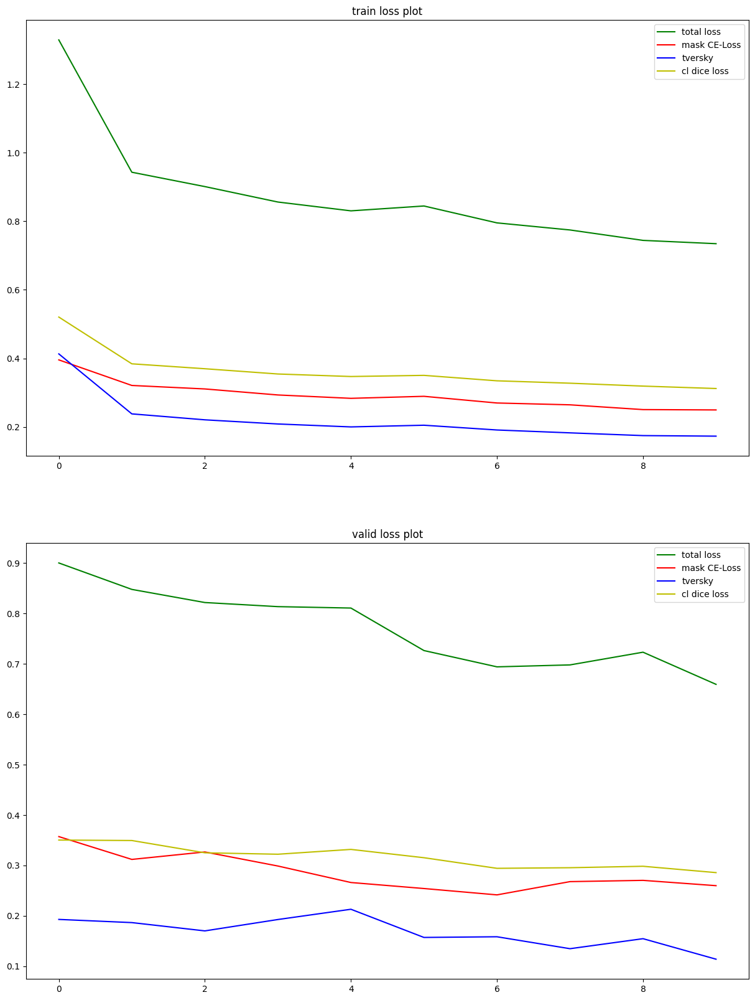

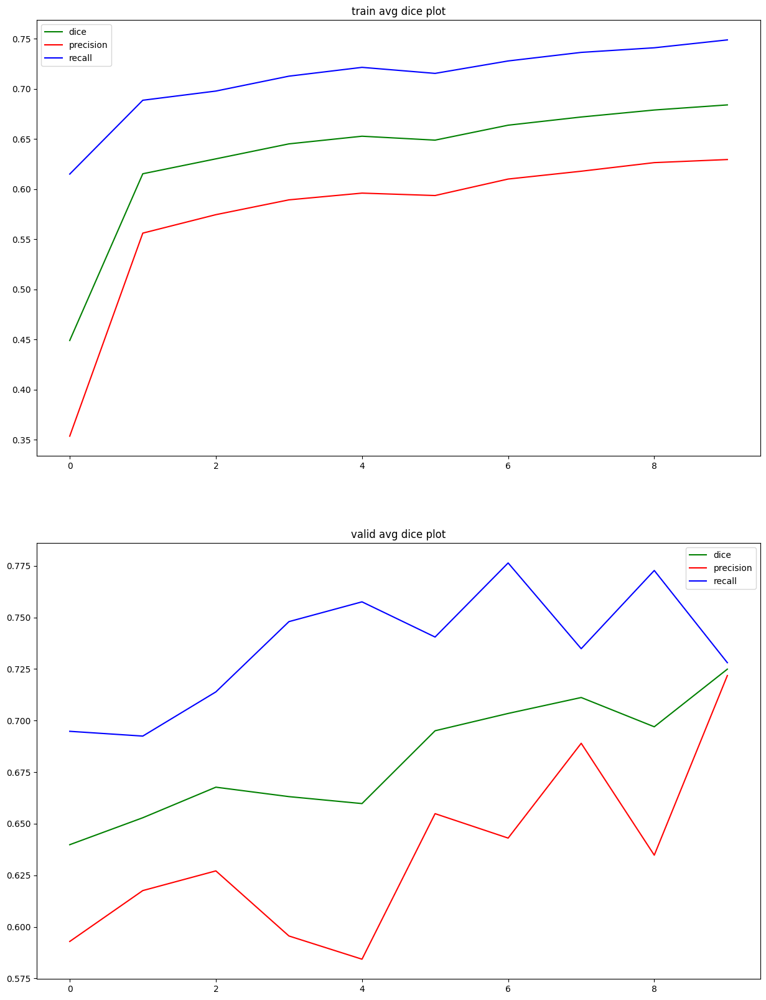

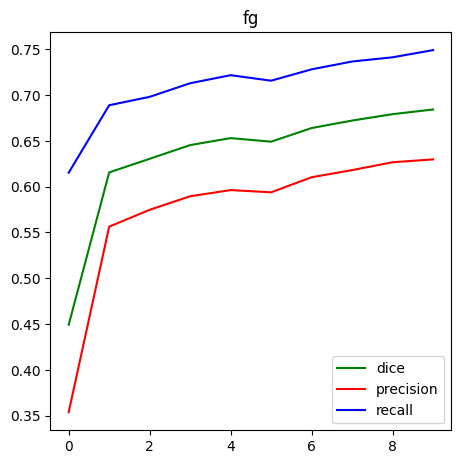

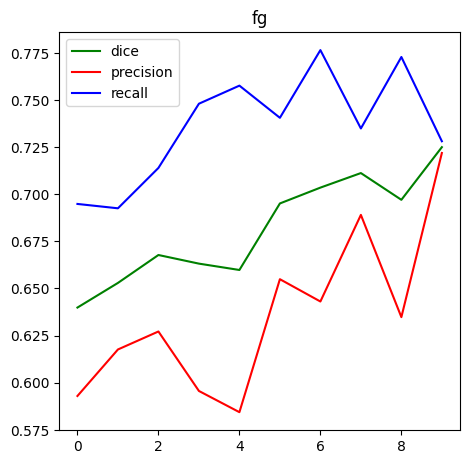

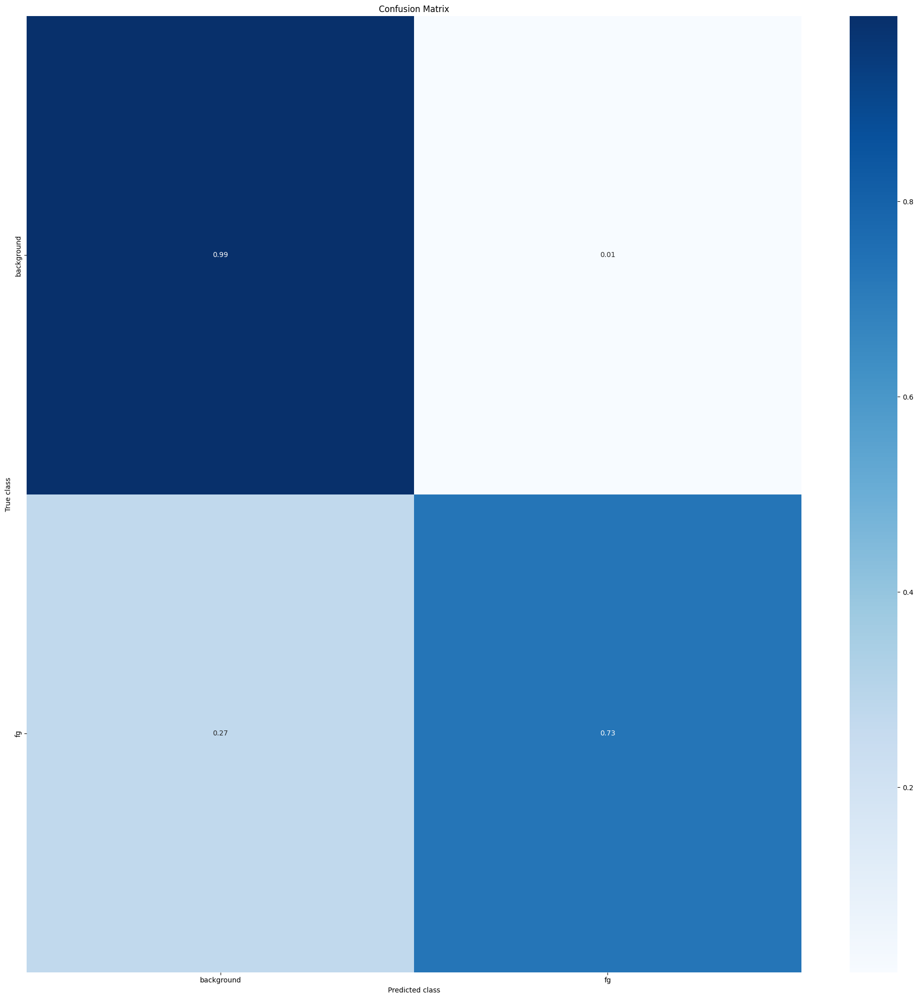

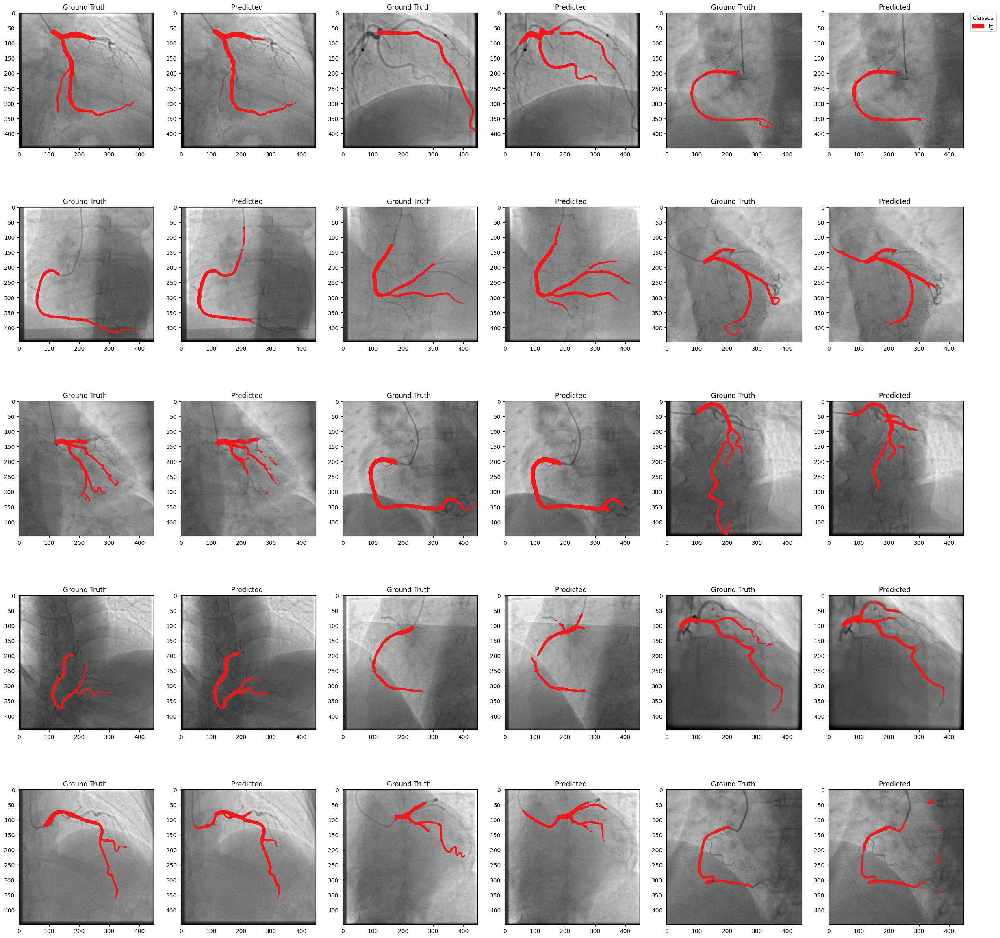

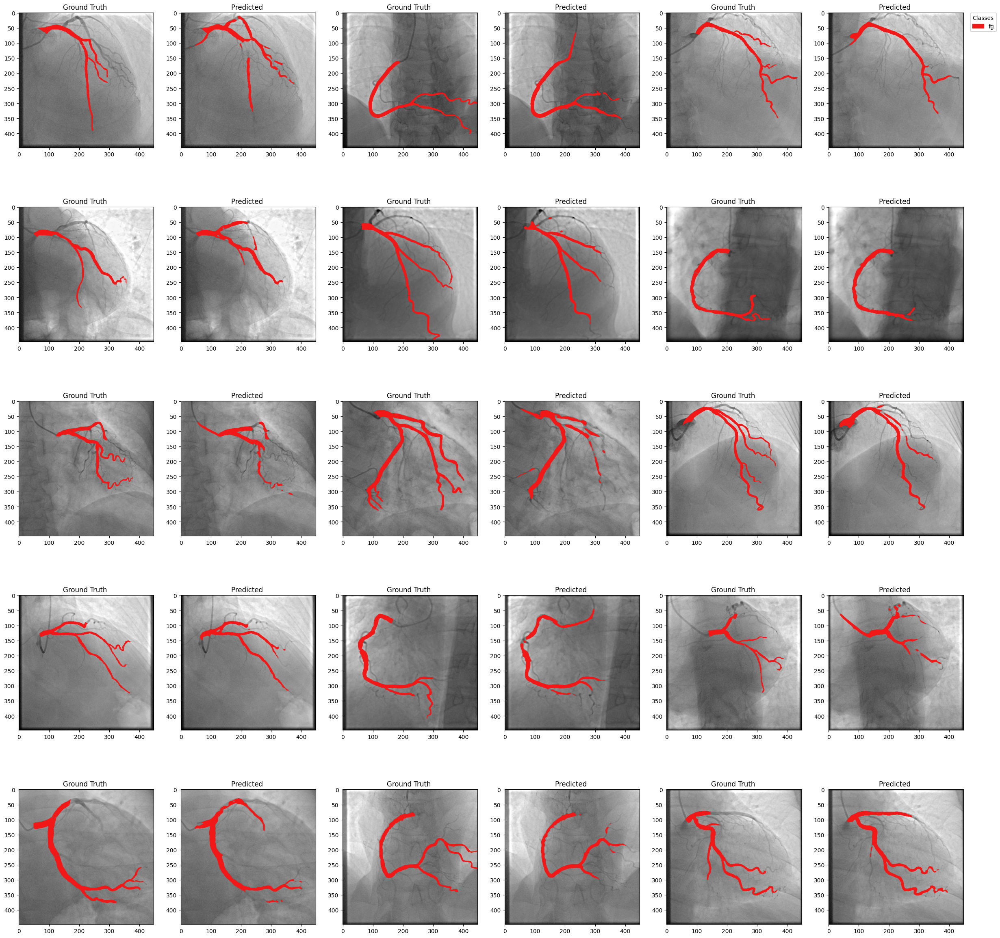

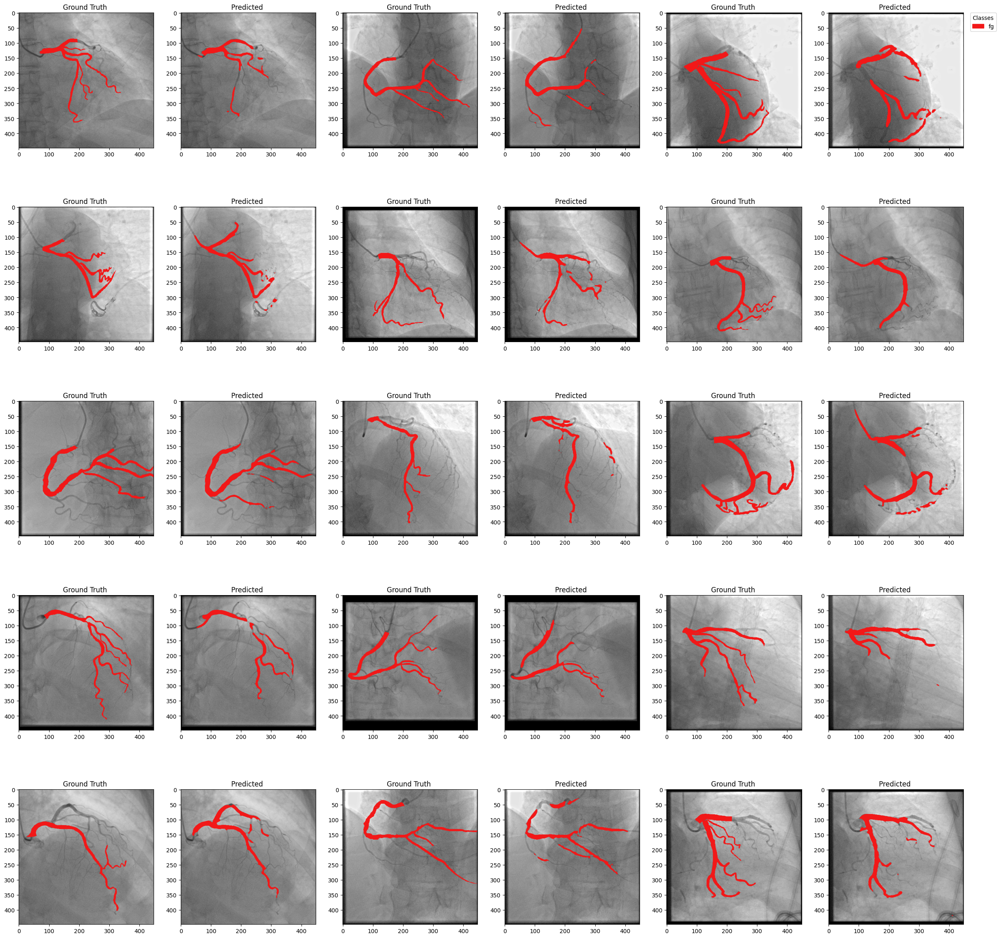

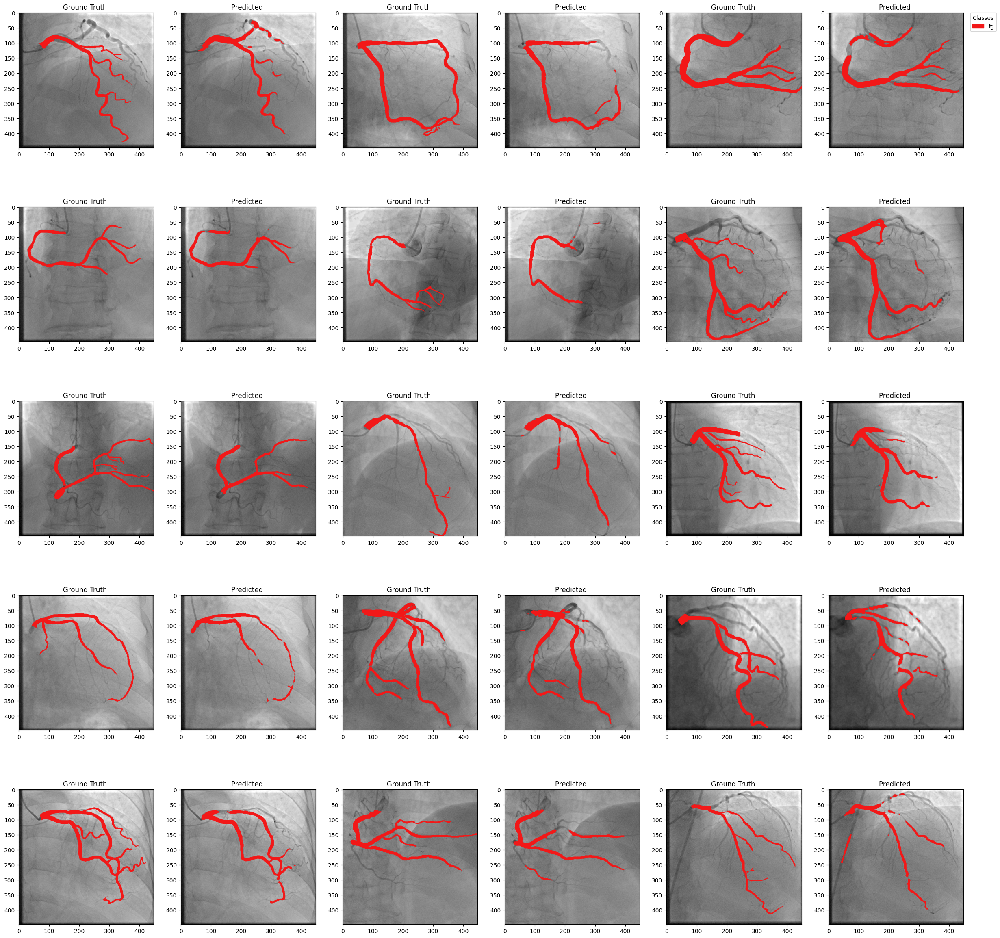

In [9]:
save_full_report(
    recorder= recorder , 
    output_base_path=args["output_base_path"],
    model=best_model,
    valid_loader=valid_loader,
    normalizer = normalizer,
    args=args,
    class_map=class_map,
    name=args["name"],
    valid_images = valid_images,
    test_transforms = test_transforms,
    notebook_name = "Multi_Main.ipynb",
    class_count = args["class_count"],
    device = args["device"],
    training_mode = args["training_mode"]
)